**Cognifyz Internship Program**

**Data Science : August-2024**

**Name - Sagar Puthapalattu**

**offer Letter :Ref CT/ A1/ C56922**

In [33]:
import pandas as pd 
import numpy as np 
import  matplotlib.pyplot as plt
import seaborn as sns
import folium
from IPython.display import display
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

$Task-1$

**Data Exploration and Preprocessing**

- Explore the dataset and identify the number 
of rows and column

- Check for missing values in each column and 
handle them accordingl

- Perform data type conversion if necessary.
Analyze the distribution of the target variabl **("Aggregate rati**") and identify any cla s
imbalances.ys

In [34]:
df = pd.read_csv("Dataset .csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [35]:
print(f" number of rows  : {df.shape[0]}")
print(f" number of columns : {df.shape[1]}")

 number of rows  : 9551
 number of columns : 21


In [36]:
df.columns
print(f"catgorical columns : {df.select_dtypes(exclude='object').columns}")
print(f" numerical column : {df.select_dtypes(include='object').columns}")

catgorical columns : Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')
 numerical column : Index(['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose',
       'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text'],
      dtype='object')


In [37]:
# Checking Missing values 

df.isnull().sum().all

<bound method Series.all of Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64>

<Axes: >

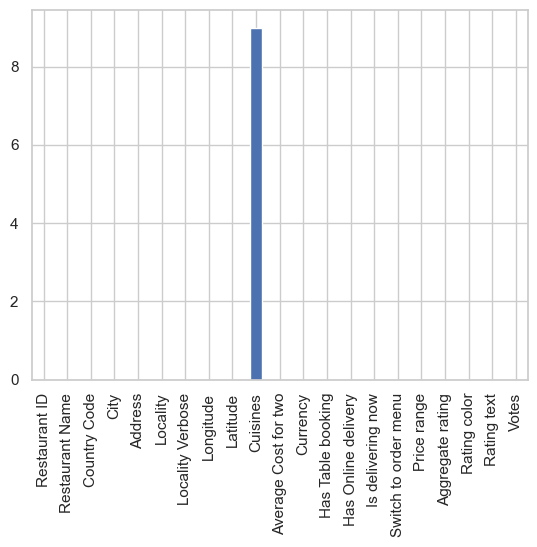

In [38]:
df.isnull().sum().plot(kind='bar')

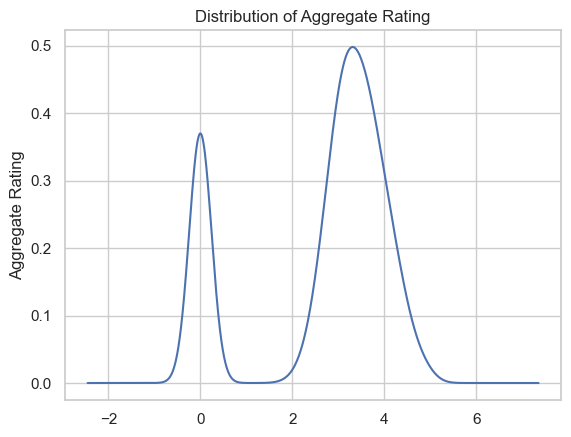

In [39]:
df['Aggregate rating'].plot(kind='kde')
plt.ylabel('Aggregate Rating')
plt.title("Distribution of Aggregate Rating")
plt.show()

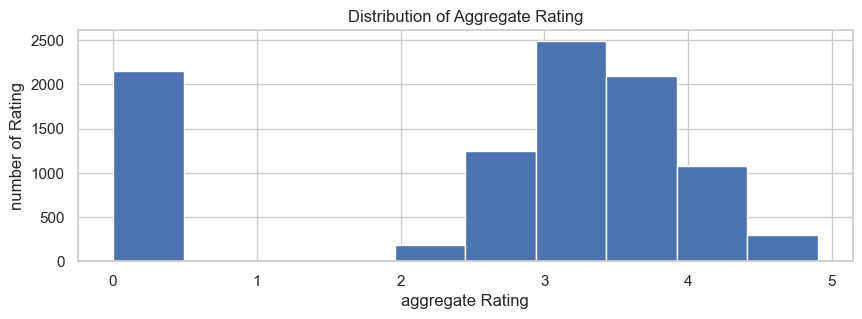

In [40]:
plt.figure(figsize=(10,3))
plt.hist(df['Aggregate rating'])
plt.xlabel("aggregate Rating")
plt.ylabel("number of Rating")
plt.title("Distribution of Aggregate Rating")
plt.show()

$Task-2$

**Descriptive Analysis**

-  Calculate basic statistical mean  for **numerical columns**

-  Explore the distribution of categorical variable like **Country Code** and **City** and **Cuisine**

-  Identify the top cuisines and Cities with the Higest number of restaurants 

In [41]:
l1=[]
cols = df.select_dtypes(exclude='object').columns
for i in cols:
    count=round(len(df[i]),2)
    min=round(df[i].min(),2)
    max =round(df[i].max(),2)
    mean=round(df[i].mean(),2)
    median=round(df[i].median(),2)
    std=round(df[i].std(),2)
    i_25q = round(np.quantile(df[i],0.25),2)
    i_50q = round(np.quantile(df[i],0.50),2)
    i_75q = round(np.quantile(df[i],0.75),2)

    l1.append([count,min,max,mean,median,std,i_25q,i_50q,i_75q])


index_val=['count','min','max','mean','median','std','25%','50%','75%']



df_mean=pd.DataFrame(l1,columns=index_val,index= cols).T


df_mean

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00,9551.00
min,53.00,1.00,-157.95,-41.33,0.00,1.00,0.00,0.00
max,18500652.00,216.00,174.83,55.98,800000.00,4.00,4.90,10934.00
mean,9051128.35,18.37,64.13,25.85,1199.21,1.80,2.67,156.91
median,6004089.00,1.00,77.19,28.57,400.00,2.00,3.20,31.00
std,8791521.28,56.75,41.47,11.01,16121.18,0.91,1.52,430.17
25%,301962.50,1.00,77.08,28.48,250.00,1.00,2.50,5.00
50%,6004089.00,1.00,77.19,28.57,400.00,2.00,3.20,31.00
75%,18352291.50,1.00,77.28,28.64,700.00,2.00,3.70,131.00


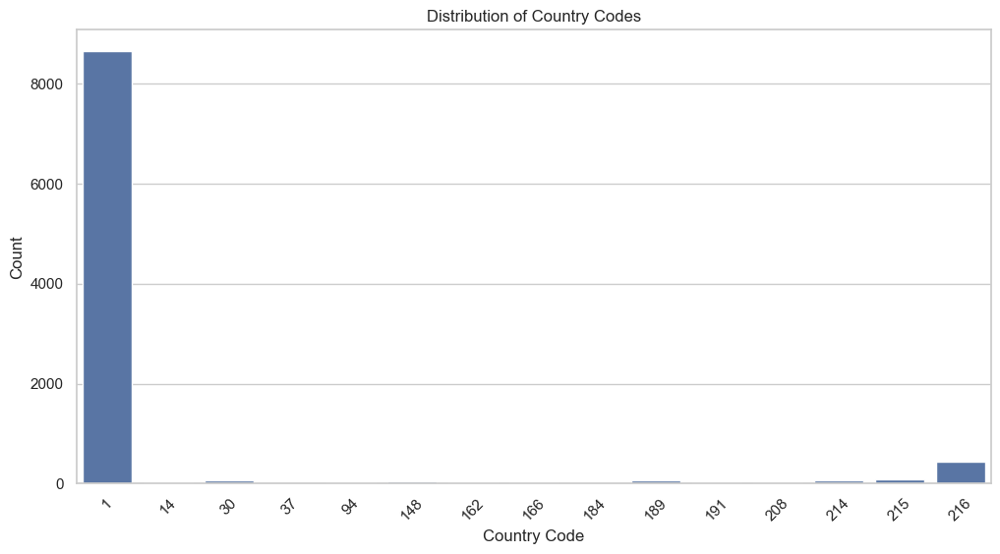

In [42]:
#distribution of categorical variables like "Country Code,

plt.figure(figsize=[12,6])
sns.countplot (x='Country Code', data=df)
plt.xlabel('Country Code')
plt.ylabel('Count')
plt.title("Distribution of Country Codes")
plt.xticks(rotation=45)
plt.show()


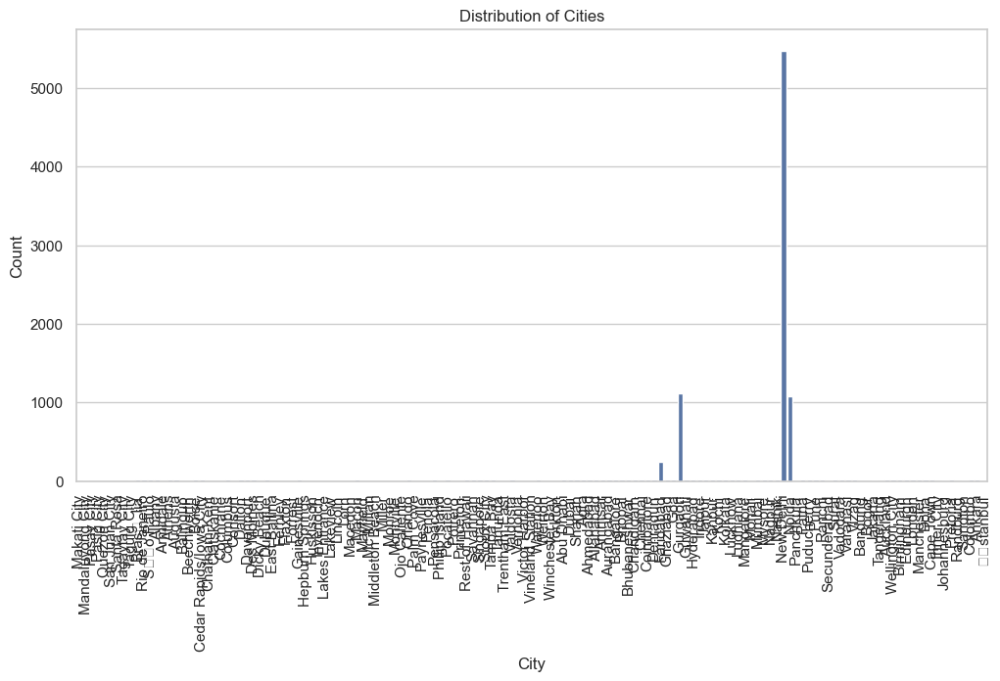

In [43]:
# Explore the distribution of "City
plt.figure(figsize=(12,6))
sns.countplot(x='City', data=df)
plt.xlabel("City")
plt.ylabel("Count")
plt.title('Distribution of Cities')
plt.xticks(rotation=90)
plt.show()

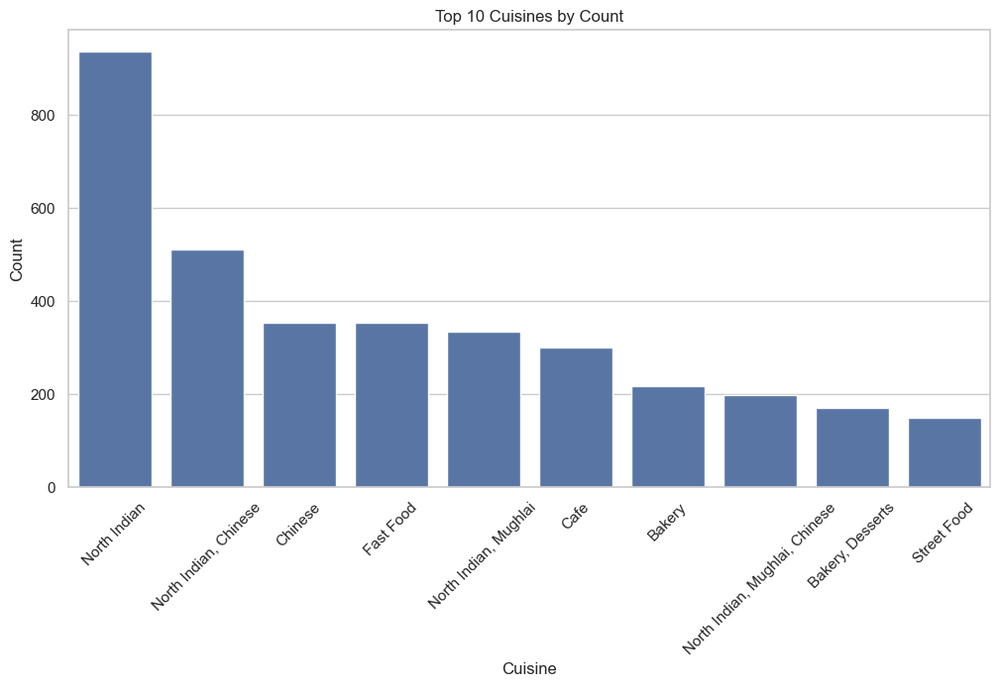

In [44]:
# Explore the distribution of 'Cuisines"
top_cuisines = df[ 'Cuisines' ].value_counts().head (10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cuisines.index, y=top_cuisines.values)
plt.xlabel('Cuisine')
plt.ylabel('Count')
plt.title('Top 10 Cuisines by Count')
plt.xticks(rotation= 45)
plt.show()

$Task-3$

**Geospatial Analysis**

- Visual the loction of restaurants on a map using **langitude** and **longitude** information

-  Analyes the distribution of restaurants across differnt cites (or) conutries

-  Determine if there is any **correlation martixes** b/w the restaurants loction and it's rating 

In [45]:
restaurant_name = df['Restaurant Name']
latitude_df  =  df['Latitude']
longitude_df = df['Longitude']

In [46]:
x = df[['Longitude','Latitude']]
num_cluster = 5

In [47]:
kmeans = KMeans(n_clusters=num_cluster,random_state=23)
df['Cluster'] = kmeans.fit_predict(x)

In [48]:
map_center = [latitude_df.mean(), longitude_df.mean()]
r_map = folium.Map(location = map_center,zoom_start=12)

In [49]:
cluster_colors = ['yellow', 'blue', 'green', 'purple', 'violet' ]

In [50]:
for index, row in df.iterrows():
    restaurant_name = row['Restaurant Name']
    latitude =row['Latitude']
    longitude = row['Longitude']
    cuisines =  row[ 'Cuisines']
    rating = row['Aggregate rating']
    cluster = row['Cluster']
    popup_text = "Restaurant: (restaurant_name]\nCuisines: (cuisines] \nRating: (rating)"
    marker =folium.Marker([latitude,longitude], popup=popup_text)
    marker.add_to(r_map)

In [51]:
display(r_map)

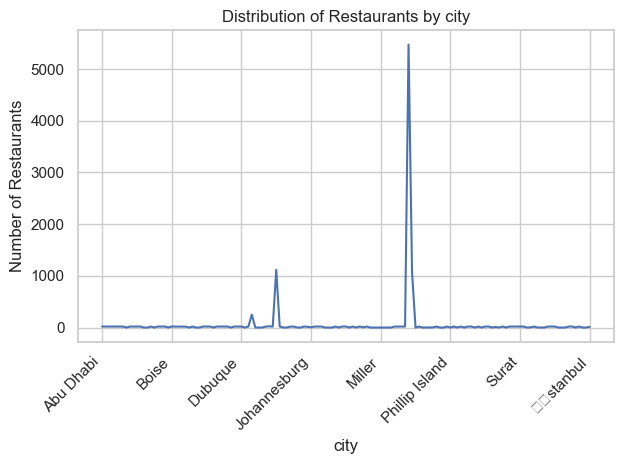

In [52]:

grouped = df.groupby('City')

restaurant_count_by_location = grouped.size()

restaurant_count_by_location.plot(kind='line')
plt.title('Distribution of Restaurants by city')
plt.xlabel('city')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [53]:

location_columns = ['Longitude', 'Latitude']
rating_column = 'Aggregate rating'

correlation_matrix =df[location_columns + [rating_column]].corr()

correlation_matrix

,Longitude,Latitude,Aggregate rating
Longitude,1.000000,0.043207,-0.116818
Latitude,0.043207,1.000000,0.000516
Aggregate rating,-0.116818,0.000516,1.000000


# lEVEL - 2 

$Task-1$

**Table Booking and Online Delivery**

- Determine the percentage of restaurants thatoffer table booking and online delivery.

- Compare the average ratings of restaurant with table booking and those without.

- Analyze the availability of online delivery among restaurants with different price ranges.

In [54]:
df['Has Table booking'].value_counts()

Has Table booking
No     8393
Yes    1158
Name: count, dtype: int64

In [55]:
Table_booking  = df[df['Has Table booking']=='Yes'].value_counts().sum()
Online_delivery = df[df['Has Online delivery']=='Yes'].value_counts().sum()

In [56]:
total_restaurants = len(df)
percentage_with_booking = (Table_booking /total_restaurants)* 100
print(f'Percentage of restaurant :{round(percentage_with_booking)} %')


Percentage of restaurant :12 %


In [57]:
percentage_onlineDelivery = (Online_delivery/total_restaurants)*100
print(f'percentage of restuarant with table booking :{round(percentage_onlineDelivery)}%')

percentage of restuarant with table booking :26%


In [58]:
avg_rating_with_table_booking = df[df['Has Table booking']=='Yes']['Aggregate rating'].mean()
avg_rating_without_table_booking = df[df['Has Table booking']=='No']['Aggregate rating'].mean()


print(f'average ratings of restaurant with table booking : {round(avg_rating_with_table_booking)}%')
print(f'average ratings of restaurant without table booking : {round(avg_rating_without_table_booking)}%')



average ratings of restaurant with table booking : 3%
average ratings of restaurant without table booking : 3%


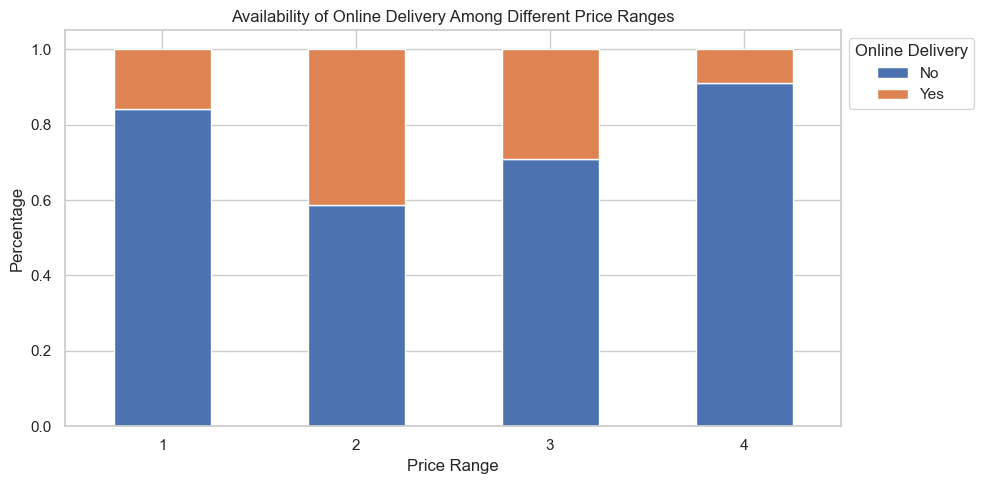

In [59]:
price_range =df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).unstack()

sns.set(style="whitegrid")
ax= price_range.plot(kind='bar', stacked= True,figsize=(10, 5))
ax.set_title("Availability of Online Delivery Among Different Price Ranges")
ax.set_xlabel("Price Range")
ax.set_ylabel("Percentage")
ax.set_xticklabels (price_range.index, rotation=0)
ax. legend (title= 'Online Delivery', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

$Task-2$

**Price Range Analysis**

- Determine the most Common price range amount all the restaurants

-  Calculate the average rating for each price range

-  identify the color that represent the highest to avgerage rating amoung differnt price range..
anges.

In [60]:
# Common price range amount all restauarants
CPRC =  df['Price range'].value_counts()
most_common_price_range = CPRC.idxmax()

print(f"Most Common price range amount all the restaurants  is : {most_common_price_range}")

Most Common price range amount all the restaurants  is : 1


In [61]:
#Average ration for price rating 
ARPR = df.groupby('Price range')['Aggregate rating'].mean()

print("Average rating for each price range:")
print(ARPR)


Average rating for each price range:
Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


In [62]:
ARPR1 = df.groupby('Price range')['Aggregate rating'].mean()

highest_ARPR1 = ARPR1.idxmax()

color_of_highest_avg_rating = df[df['Price range'] == highest_ARPR1]['Rating color'].iloc[0]
print(f"The color that represents the highest average rating ({highest_ARPR1}) is: {color_of_highest_avg_rating}")


The color that represents the highest average rating (4) is: Green


$Task-3$

**Feature Engineering**

- Extract additional features from the existing columns, such as the length of the restaurant name or address. 

- Create new features like "Has Table Booking" or "Has Online Delivery" by encoding categorical variables.


In [63]:
d = {'Yes': 1, 'No': 0}
d


{'Yes': 1, 'No': 0}

In [64]:
# Create new features like "Has Table Booking"
# or "Has Online Delivery" by encoding
# categorical variables.



# Perform Maping function encoding  for "Has Table Booking" and "Has Online Delivery" columns
df['Has Online delivery']=df['Has Online delivery'].map(d)

df['Has Table booking']=df['Has Table booking'].map(d)

df.head(1)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Cluster
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,1,0,No,No,3,4.8,Dark Green,Excellent,314,0


# Level -3 

**Predictive Modeling**

-  Build a regression model to predict the aggregate rating of a restaurant based on available features.

-  Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.

-  Experiment with different algorithms (e.g.,linear regression, decision trees, random forest) and compare their performance.

In [65]:
# genratiog machine learning model 

from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics  import mean_squared_error

In [66]:
df['num_rating'] = df['Rating text']
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Cluster,num_rating
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,0,No,No,3,4.8,Dark Green,Excellent,314,0,Excellent
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,0,No,No,3,4.5,Dark Green,Excellent,591,0,Excellent
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,0,No,No,4,4.4,Green,Very Good,270,0,Very Good
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,0,No,No,4,4.9,Dark Green,Excellent,365,0,Excellent
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,0,No,No,4,4.8,Dark Green,Excellent,229,0,Excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,0,No,No,3,4.1,Green,Very Good,788,4,Very Good
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,0,No,No,3,4.2,Green,Very Good,1034,4,Very Good
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,0,No,No,4,3.7,Yellow,Good,661,4,Good
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,0,No,No,4,4.0,Green,Very Good,901,4,Very Good


*one-hot encoder to categoriacl to numerical*

In [67]:
from sklearn.preprocessing import OneHotEncoder
print(df['Rating text'].unique())
df['Rating text']= df['Rating text'].astype('category')
df['num rating']= df['Rating text'].cat.codes
encoder= OneHotEncoder()
encoder_df = pd.DataFrame(encoder.fit_transform(df[['num rating']]).toarray())
New_df = df.join(encoder_df)
New_df.columns

['Excellent' 'Very Good' 'Good' 'Average' 'Not rated' 'Poor']


Index([       'Restaurant ID',      'Restaurant Name',         'Country Code',
                       'City',              'Address',             'Locality',
           'Locality Verbose',            'Longitude',             'Latitude',
                   'Cuisines', 'Average Cost for two',             'Currency',
          'Has Table booking',  'Has Online delivery',    'Is delivering now',
       'Switch to order menu',          'Price range',     'Aggregate rating',
               'Rating color',          'Rating text',                'Votes',
                    'Cluster',           'num_rating',           'num rating',
                            0,                      1,                      2,
                            3,                      4,                      5],
      dtype='object')

In [68]:
# Select features and target variable

feature_cols = ['Has Online delivery','Has Table booking','Votes','Price range']

target = ['Aggregate rating']

X = New_df[feature_cols]

y = New_df[target]

#Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


model = LinearRegression()

model.fit(X_train,y_train)


y_perdicition = model.predict(X_test)


mse = mean_squared_error(y_test,y_perdicition)

print(f'mean squared error :{mse:.2f}%')


mean squared error :1.68%


**Random Forest**

In [71]:


from sklearn.metrics import r2_score



features = ['Has Online delivery','Has Table booking', 'Votes', 'Price range','Is delivering now','num rating'] 

target = ['Aggregate rating']

X = New_df[features]
y = New_df[target]

X = pd.get_dummies(X, columns=['Is delivering now'], drop_first=True)

#Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

random_model = RandomForestRegressor(n_estimators=100, random_state=42)


random_model.fit(X_train, y_train)


yr_pred = random_model.predict(X_test)


r2 = r2_score(y_test, yr_pred)

print(f"R-squared (Accuracy): {r2:.2f}")



R-squared (Accuracy): 0.98


**Decision Tree**

In [72]:
features = ['Has Online delivery','Has Table booking', 'Votes', 'Price range','Is delivering now','num rating'] 

target = ['Aggregate rating']



X = New_df[features]
y = New_df[target]

X = pd.get_dummies(X, columns=['Is delivering now'], drop_first=True)
#Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


DT = DecisionTreeRegressor()


DT.fit(X_train,y_train)


y_dt_pred = DT.predict(X_test)


mse_DT = mean_squared_error(y_test,y_dt_pred)


print(f'mean squared error : {mse_DT:.2f}%')




mean squared error : 0.04%


# LEVEL 3

$TASK:2$

**Customer Preference Analysis**

- Analyze the relationship between the type of cuisine and the **restaurant's rating.**

- Identify the most popular cuisines among customers based on the number of votes.

- Determine if there are any specific cuisines that tend to receive higher ratings.

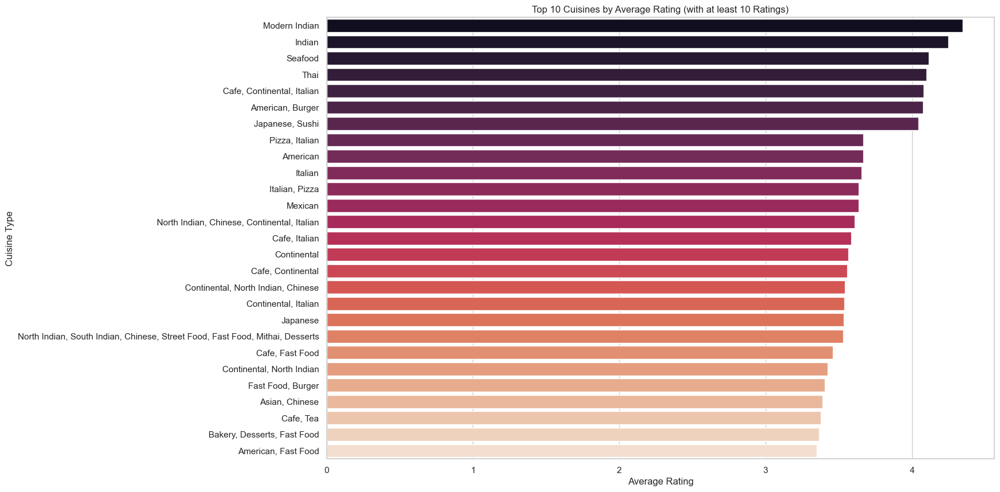

In [73]:
# Analyze the relationship between the type of cuisine and the restaurant's rating.

# Group the data by cuisine type and calculate the mean and count of Aggregate rating
cuisine_rating_summary = df.groupby('Cuisines')['Aggregate rating'].agg(['mean', 'count'])

# Filter cuisines with at least 10 ratings
cuisine_rating_summary = cuisine_rating_summary[cuisine_rating_summary['count'] >= 10]

# Sort by average rating in descending order
cuisine_rating_summary = cuisine_rating_summary['mean'].sort_values(ascending=False)

# Plotting the top 10 cuisines with highest average ratings
top_cuisines = cuisine_rating_summary.head(27)
plt.figure(figsize=(15, 10))
sns.barplot(x=top_cuisines, y=top_cuisines.index, palette='rocket')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine Type')
plt.title('Top 10 Cuisines by Average Rating (with at least 10 Ratings)')
plt.show()


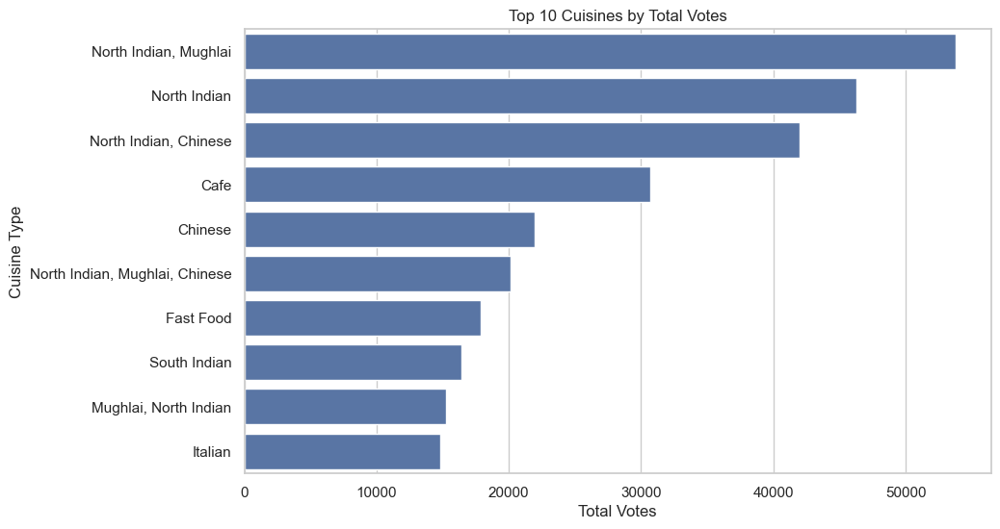

In [74]:
#Identify the most popular cuisines among customers based on the number of votes.

# Group the data by cuisine type and calculate the sum of Votes
total_votes_by_cuisine = df.groupby('Cuisines')['Votes'].sum()

# Sort the cuisines by total number of votes in descending order
total_votes_by_cuisine = total_votes_by_cuisine.sort_values(ascending=False)

# Plotting the top 10 cuisines with highest total votes
top_cuisines = total_votes_by_cuisine.head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_cuisines, y=top_cuisines.index)
plt.xlabel('Total Votes')
plt.ylabel('Cuisine Type')
plt.title('Top 10 Cuisines by Total Votes')
plt.show()


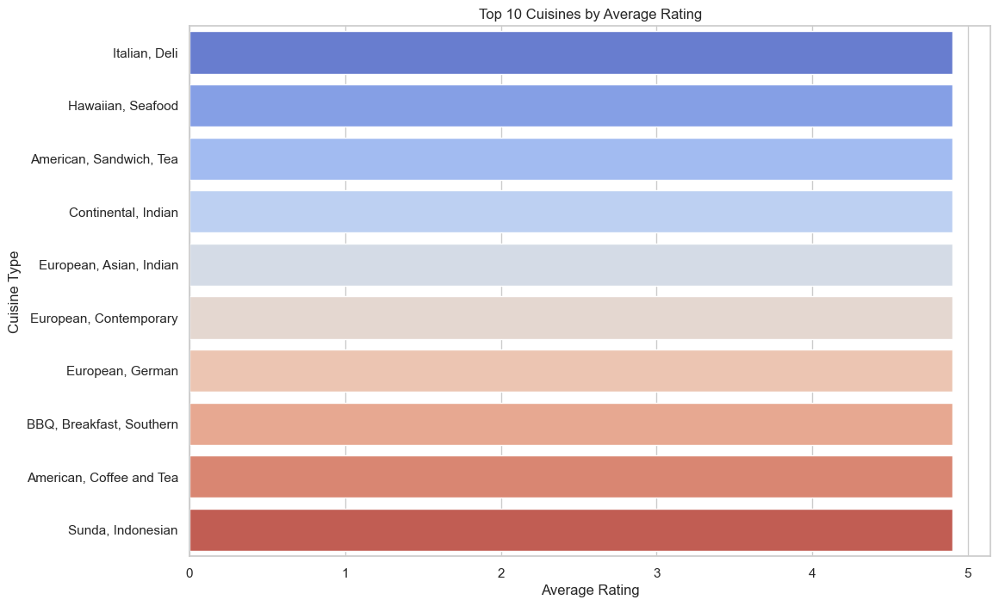

In [75]:
# Determine if there are specific cuisines that tend to receive higher ratings.

# Group the data by cuisine type and calculate the mean of Aggregate rating
average_rating_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean()

# Sort the cuisines by average rating in descending order
average_rating_by_cuisine = average_rating_by_cuisine.sort_values(ascending=False)

# Plotting the top 10 cuisines with the highest average ratings
top_cuisines = average_rating_by_cuisine.head(10)
plt.figure(figsize=(12, 8))
sns.barplot(x=top_cuisines, y=top_cuisines.index, palette='coolwarm')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine Type')
plt.title('Top 10 Cuisines by Average Rating')
plt.show()


$Task:3$

**Data Visualization**

- Create visualizations to represent the distribution of ratings using different charts (histogram, bar plot, etc.)

- Compare the average ratings of different cuisines or cities using appropriate visualizations.

- Visualize the relationship between various features and the target variable to gain insights.

ts.


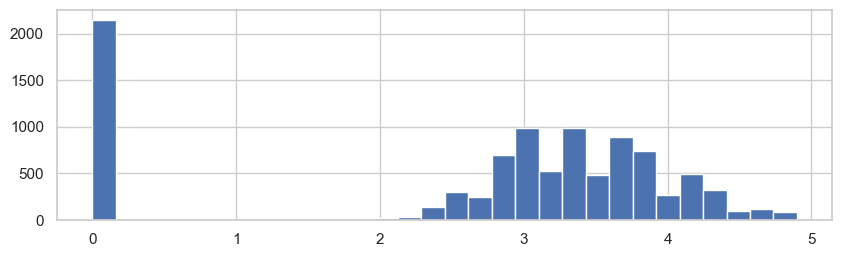

In [76]:
plt.figure(figsize=(10,6))
plt.subplot(2,1,2).hist(df['Aggregate rating'],bins=30)
plt.show()

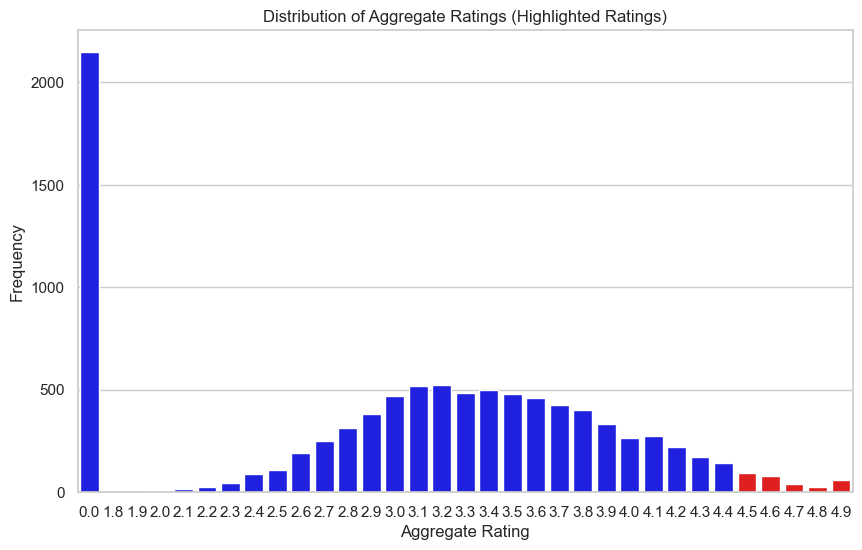

In [77]:
# Highlight specific ratings (e.g., ratings above 4.5)
plt.figure(figsize=(10, 6))
rating_counts = df['Aggregate rating'].value_counts().sort_index()
highlight_color = ['red' if x >= 4.5 else 'blue' for x in rating_counts.index]
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette=highlight_color)

plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Aggregate Ratings (Highlighted Ratings)')
plt.show()


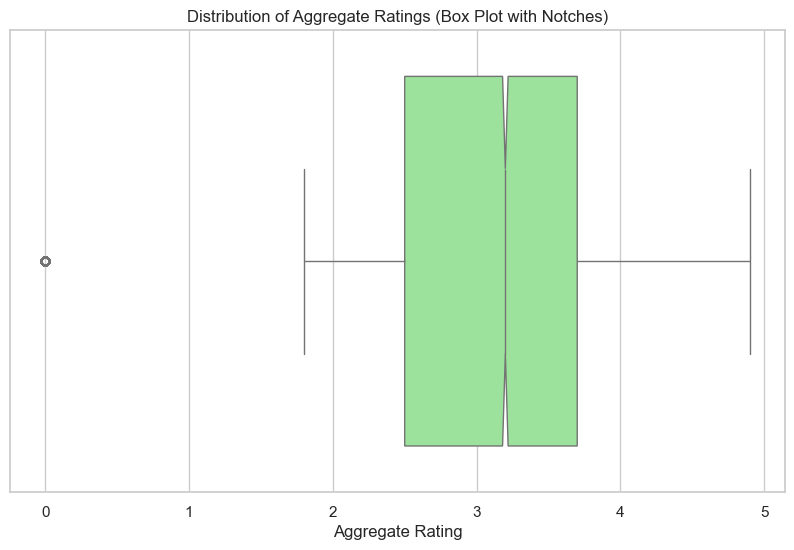

In [78]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Aggregate rating'], color='lightgreen', notch=True)
plt.xlabel('Aggregate Rating')
plt.title('Distribution of Aggregate Ratings (Box Plot with Notches)')
plt.show()


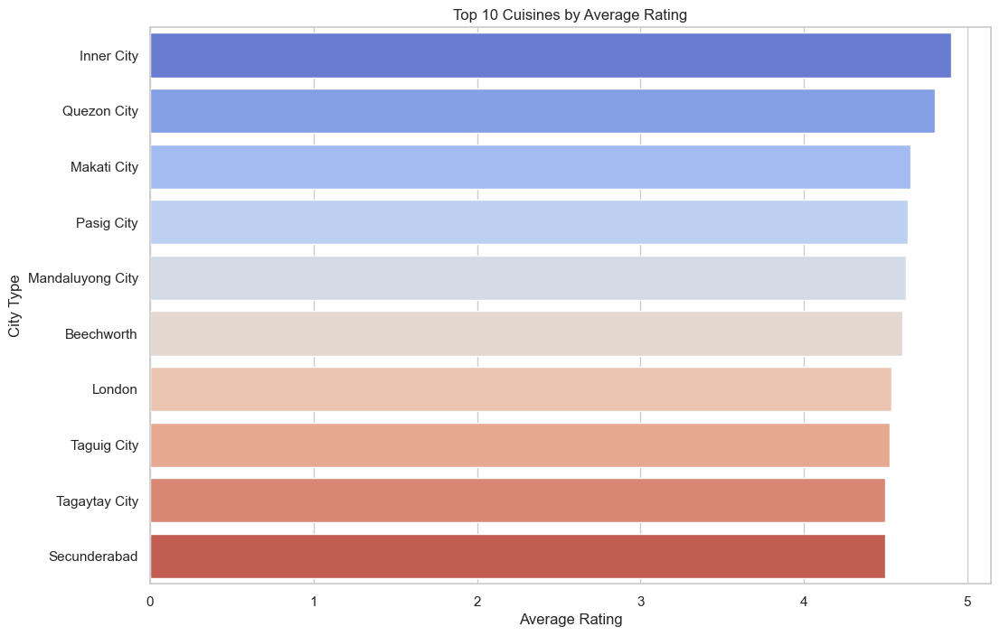

In [82]:
# Calculate the average rating for each cuisine from  each city
average_rating_by_cuisine = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)

# Plotting the top 10 cuisines with the highest average ratings
plt.figure(figsize=(12, 8))
sns.barplot(x=average_rating_by_cuisine.head(10), y=average_rating_by_cuisine.index[:10], palette='coolwarm')
plt.xlabel('Average Rating')
plt.ylabel('City Type')
plt.title('Top 10 Cuisines by Average Rating')
plt.show()


**Visualize the relationship between various features and the target variable to gain insights.**

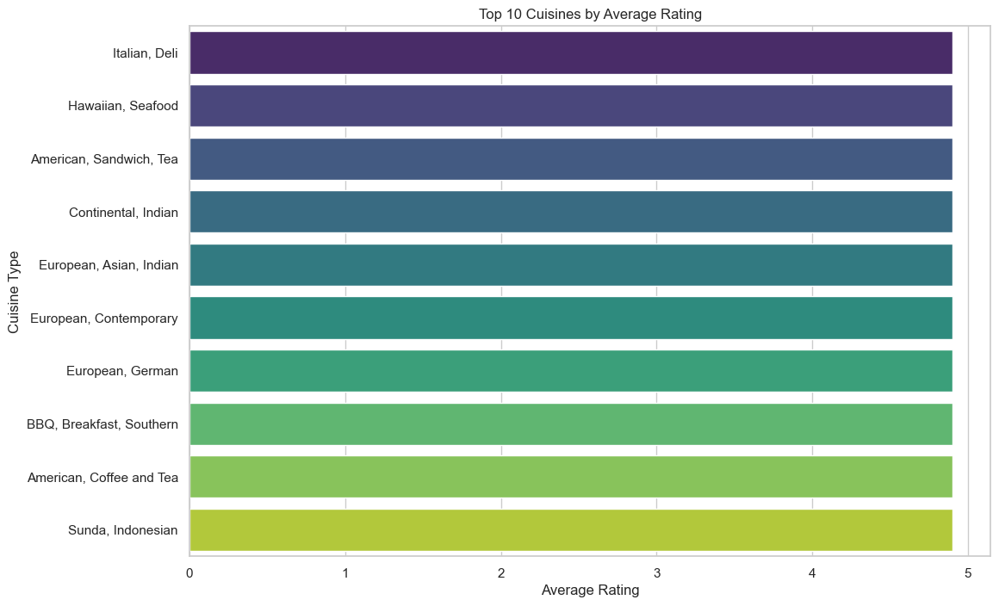

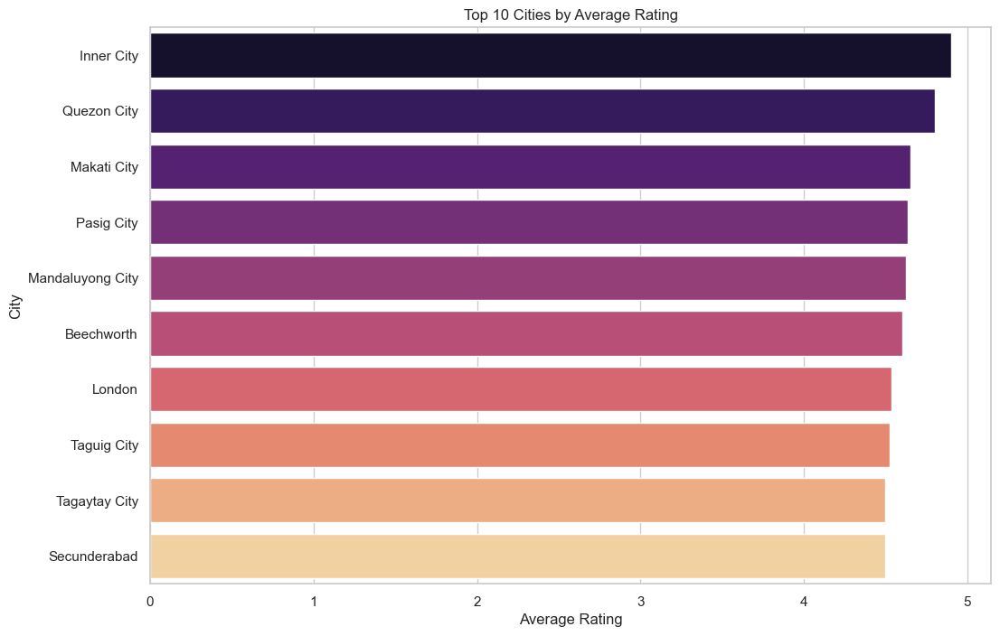

In [83]:
# Bar plot for average Aggregate Rating by Cuisine Type
plt.figure(figsize=(12, 8))
average_rating_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
sns.barplot(x=average_rating_by_cuisine.head(10), y=average_rating_by_cuisine.index[:10], palette='viridis')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine Type')
plt.title('Top 10 Cuisines by Average Rating')
plt.show()

# Bar plot for average Aggregate Rating by City
plt.figure(figsize=(12, 8))
average_rating_by_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
sns.barplot(x=average_rating_by_city.head(10), y=average_rating_by_city.index[:10], palette='magma')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.title('Top 10 Cities by Average Rating')
plt.show()
